In [23]:
import umap
from sklearn.datasets import load_iris
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from torch.nn.functional import softmax

In [24]:
import torch 
pe = torch.load("politician_emotions_corporation.pt")

In [25]:
# From left to right
corporation_bias_ordered = ['cnn', 'npr', 'politico', 'apnews', 'washtimes', 'dailycaller', 'foxnews', 'breitbart']

In [26]:
pe.keys()

dict_keys(['Joe Biden', 'Donald Trump', 'Barack Obama', 'Hillary Clinton', 'Kamala Harris', 'Kevin McCarthy', 'Mike Pence', 'Nancy Pelosi', 'Antony Blinken', 'Mitch McConnell', 'Ted Cruz'])

In [27]:
pe['Joe Biden'].keys()

dict_keys(['foxnews', 'cnn', 'washtimes', 'dailycaller', 'politico', 'breitbart', 'npr', 'apnews'])

In [28]:
pe['Joe Biden']['foxnews']
# (faces_embedding_matrix, emotion_logit_matrix, urls)

(tensor([[ 1.3836,  3.8473, -2.2697,  ..., -0.2757, -1.8399,  0.6537],
         [ 3.2642, -1.2436, -0.5368,  ..., -0.6837, -1.1098, -2.0723],
         [-0.1996, -1.1547, -0.5332,  ...,  2.4234,  0.5321,  1.3657],
         ...,
         [ 0.6809,  0.4248,  0.9194,  ...,  0.3474,  0.8610, -0.4284],
         [-0.1996, -1.1547, -0.5332,  ...,  2.4234,  0.5321,  1.3657],
         [ 1.0587, -0.6337,  0.1998,  ...,  3.5674,  1.5974,  0.0848]]),
 tensor([[-2.4192, -0.8041,  0.0986,  ...,  0.2505,  0.6798,  1.3088],
         [-1.6935,  0.3106,  0.1689,  ..., -0.0072, -0.6107,  1.1245],
         [-2.9205, -0.3476, -1.0558,  ..., -0.8995, -0.2432,  0.1738],
         ...,
         [-2.5826, -0.0843,  0.9553,  ..., -0.4163,  0.2903,  0.1391],
         [-2.9205, -0.3476, -1.0558,  ..., -0.8995, -0.2432,  0.1738],
         [-3.7988,  2.7982, -1.0118,  ..., -2.9308, -2.2397, -0.2361]]),
 ['https://a57.foxnews.com/static.foxnews.com/foxnews.com/content/uploads/2022/02/640/320/GettyImages-1372587333.jpg

In [29]:
def cor_name(data, cor, a=0, method=None):
    """
    Plot of specific corporation with politician name as label
    data: data dictionary with format  {"cors": (embd faces, emo logits, name labels)}
    cor: name of corporation (e.g. foxnews)
    a: 0 if embedding face, 1 if emotions
    method: umap or pca. If None, plot both.
    """
    
    if method != None:
        if method == "umap":
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')

            # Fit the model to your data and transform it
            embedding = reducer.fit_transform(data[cor][a])

        elif method == "pca":
            pca = PCA(n_components=2)
            embedding = pca.fit_transform(data[cor][a])

        # Plotting the results
        plt.scatter(embedding[:, 0], embedding[:, 1], c=data[cor][2], cmap='Spectral', s=5)
        plt.gca().set_aspect('equal', 'datalim')

        colorbar = plt.colorbar(boundaries=np.arange(len(pe.keys())+1)-0.5)
        colorbar.set_ticks(np.arange(len(pe.keys())))
        colorbar.set_ticklabels(list(pe.keys()))  # Custom labels
        colorbar.set_label('Name of Politicians' )

        plt.title(cor, fontsize=24)
        plt.show()
        return

    fig, axs = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
    
    # First plot
    reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')
    embedding = reducer.fit_transform(data[cor][a])
    sc1 = axs[0].scatter(embedding[:, 0], embedding[:, 1], c=data[cor][2], cmap='Spectral', s=5)
    axs[0].set_aspect('equal', 'datalim')
    axs[0].set_title('UMAP')
    

    # Second plot (identical to the first)
    pca = PCA(n_components=2)
    embedding = pca.fit_transform(data[cor][a])
    sc2 = axs[1].scatter(embedding[:, 0], embedding[:, 1], c=data[cor][2], cmap='Spectral', s=5)
    axs[1].set_aspect('equal', 'datalim')
    axs[1].set_title('PCA')
    colorbar = fig.colorbar(sc2, ax=axs[1], boundaries=np.arange(len(pe.keys())+1)-0.5)
    colorbar.set_ticks(np.arange(len(pe.keys())))
    colorbar.set_ticklabels(list(pe.keys()))
    colorbar.set_label('Name of Politicians')

    # Set the common title
    fig.suptitle(cor, fontsize=24)

    plt.show()


    


In [30]:
data = {}
# {"cors": (embd faces, emo logits, name labels)}


for cor in corporation_bias_ordered:
    d = []  # Facial Embedding vectors
    e = []  # Emotion logits
    name_label = []
    count = 0
    for key, val in pe.items():
        d.append(val[cor][1])
        e.append(val[cor][0])
        name_label += [count]*len(val[cor][2])
        count += 1
    d = torch.cat(d, dim=0)
    e = torch.cat(e, dim=0)
    data[cor] = (d,e,name_label)

/Users/kikuamano/miniforge3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


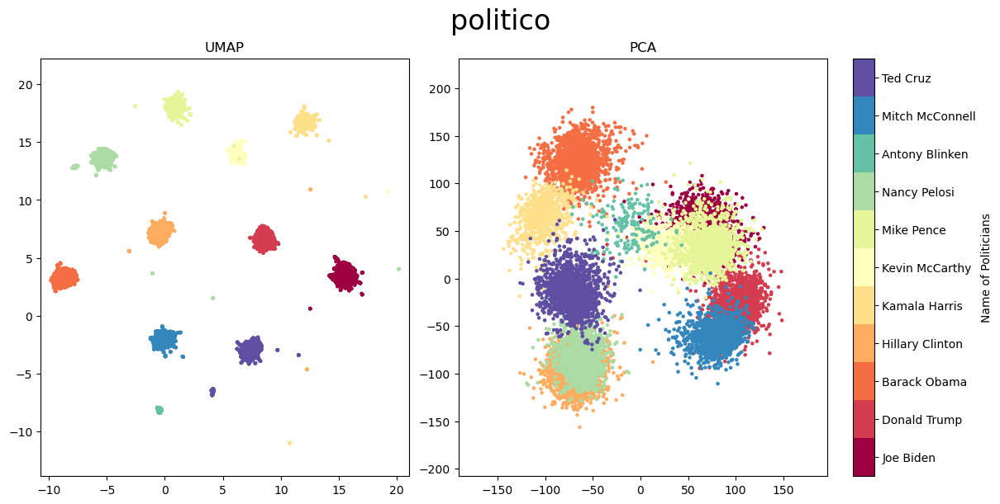

In [10]:
#Q1 Whether the embedding vectors of faces distinguish each politicians?
# Reduce face embedding vector to 2 dimension for each news corporation
cor_name(data, 'politico')

/Users/kikuamano/miniforge3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


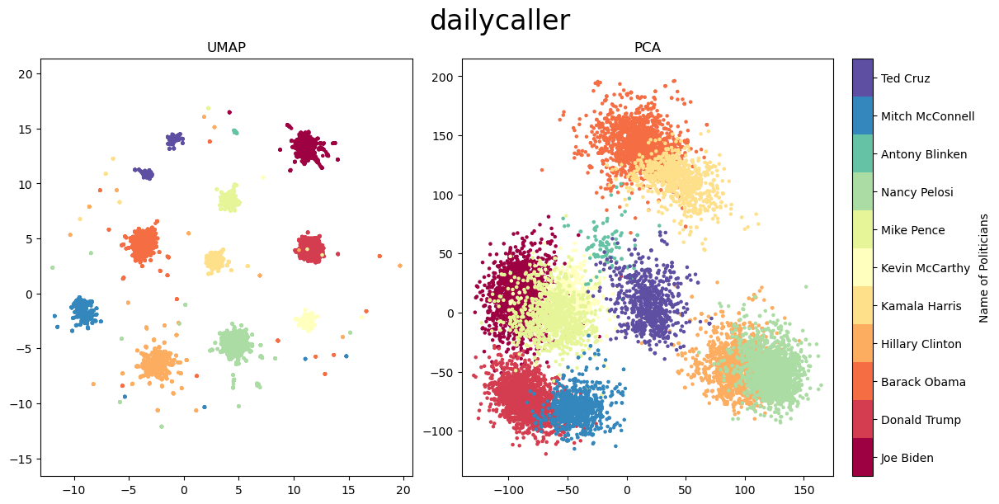

In [11]:
cor_name(data,'dailycaller')

/Users/kikuamano/miniforge3/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


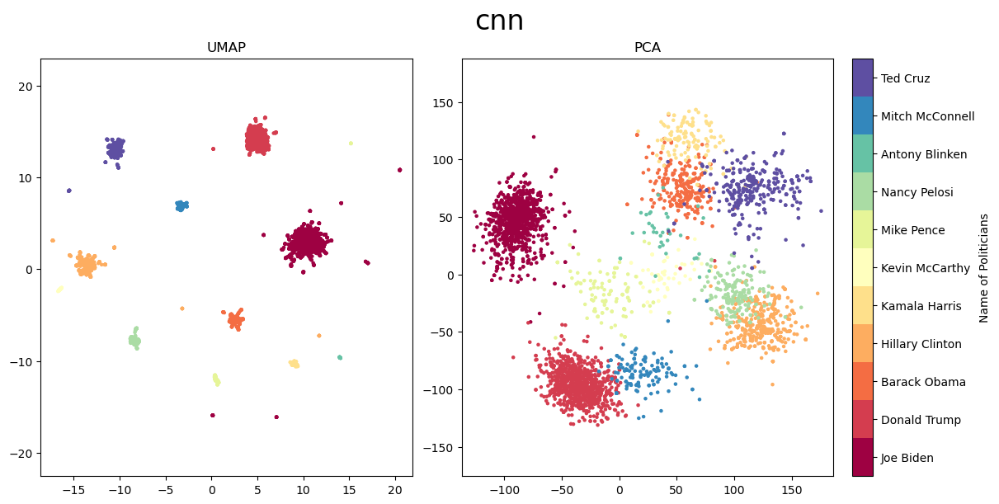

In [12]:
cor_name(data,'cnn')

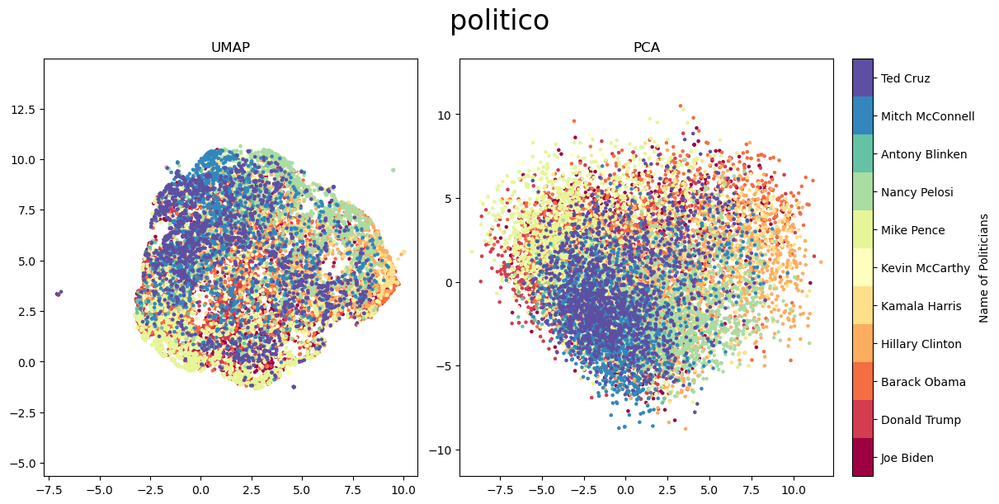

In [13]:
# Q2 Whether the emotion logits distinguish each politicians?
cor_name(data, 'politico', a=1)

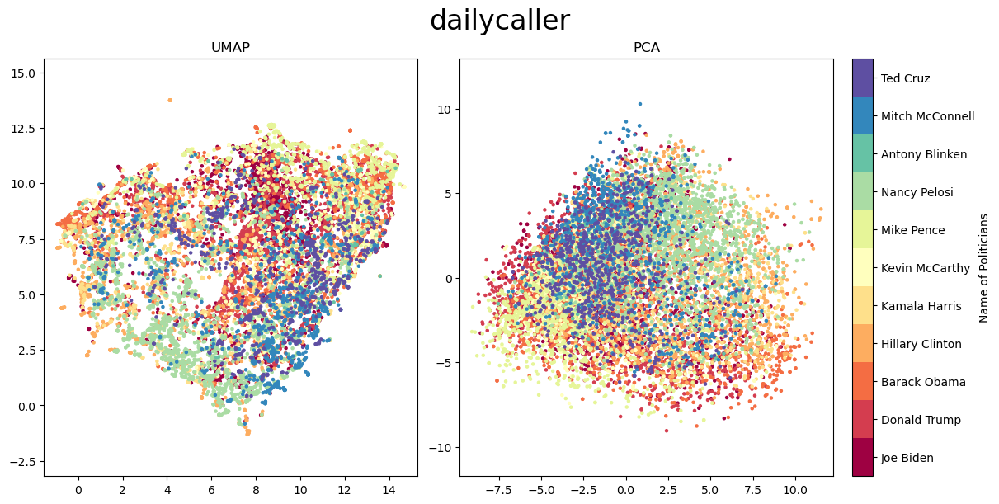

In [14]:
cor_name(data, 'dailycaller', a=1)

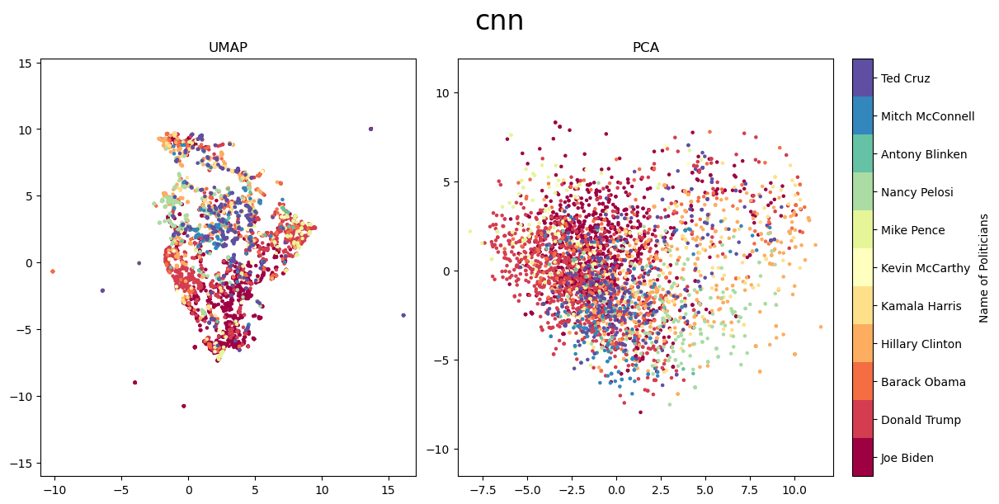

In [15]:
cor_name(data, 'cnn', a=1)

In [32]:
corporation_bias_ordered = ['cnn', 'npr', 'politico', 'apnews', 'washtimes', 'dailycaller', 'foxnews', 'breitbart']
corporation_bias_ordered.reverse()

def name_cor(data, name, a=0, method=None):
    """
    Plot of specific politicians with corporation/wing as label
    data: data dictionary with format {"names": (embd faces, emo logits, cor/wing labels)}
    name: name of politicians (e.g. Joe Biden)
    a: 0 if embedding face, 1 if emotions
    method: umap or pca. If None, plot both.
    """
    if method is not None:
        if method == "umap":
            reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')

            # Fit the model to your data and transform it
            embedding = reducer.fit_transform(data[name][a])
        elif method == "pca":
            pca = PCA(n_components=2)
            embedding = pca.fit_transform(data[name][a])

        # Plotting the results
        n_labels = len(np.unique(data[name][2]))
        plt.scatter(embedding[:, 0], embedding[:, 1], c=data[name][2], cmap='Spectral', s=5)
        plt.gca().set_aspect('equal', 'datalim')

        colorbar = plt.colorbar(boundaries=np.arange(n_labels+1)-0.5)
        colorbar.set_ticks(np.arange(n_labels))
        if n_labels == 2:
            colorbar.set_ticklabels(['Right','Left'])
            colorbar.set_label('News Wing')
        else:
            colorbar.set_ticklabels(corporation_bias_ordered)
            colorbar.set_label('News Corporations')

        plt.title(name, fontsize=24)
        plt.show()
        return
    
    fig, axs = plt.subplots(1, 2, figsize=(12, 6), constrained_layout=True)
    
    # First plot
    reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')
    embedding = reducer.fit_transform(data[name][a])
    sc1 = axs[0].scatter(embedding[:, 0], embedding[:, 1], c=data[name][2], cmap='Spectral', s=5)
    axs[0].set_aspect('equal', 'datalim')
    axs[0].set_title('UMAP')
    
    embd_UMAP = embedding

    # Second plot (identical to the first)
    pca = PCA(n_components=2)
    embedding = pca.fit_transform(data[name][a])
    sc2 = axs[1].scatter(embedding[:, 0], embedding[:, 1], c=data[name][2], cmap='Spectral', s=5)
    axs[1].set_aspect('equal', 'datalim')
    axs[1].set_title('PCA')
    
    n_labels = len(np.unique(data[name][2]))
    colorbar = fig.colorbar(sc2, ax=axs[1], boundaries=np.arange(n_labels+1)-0.5)
    colorbar.set_ticks(np.arange(n_labels))
    if n_labels == 2:
        colorbar.set_ticklabels(['Right','Left'])
        colorbar.set_label('News Wing')
    else:
        colorbar.set_ticklabels(corporation_bias_ordered)
        colorbar.set_label('News Corporations')

    # Set the common title
    fig.suptitle(name, fontsize=24)

    plt.show()
    

In [33]:
data2 = {}
# {"names": (embd faces, emo logits, cor labels)}

for name, val in pe.items():
    d = [] #embedding vectors
    e = [] #emotion
    urls = [] #URLs
    cor_label = []
    count = 0
    for cor in corporation_bias_ordered:

        d.append(val[cor][1])
        e.append(val[cor][0])
        urls+=val[cor][2]
        cor_label += [count]*len(val[cor][2])

        count += 1
        #if cor in ['cnn', 'npr', 'politico', 'apnews']: # left wing
        #    cor_label += [1]*len(val[2])
        #else:                                           # right wing
        #    cor_label += [0]*len(val[2])
    d = torch.cat(d, dim=0)
    e = torch.cat(e, dim=0)
    
    #Logit
    data2[name] = (d,e,cor_label,urls)
    # Probability
    # data2[name] = (d,softmax(e,dim=1),cor_label)

In [19]:
val

{'foxnews': (tensor([[ 0.6546, -5.1124, -4.2806,  ...,  4.9098,  0.1942,  4.9553],
          [ 2.2080, -2.2590, -0.6425,  ...,  2.2864,  0.5106, -0.4421],
          [ 0.3534, -3.5267, -1.7042,  ...,  1.8585,  6.5230,  2.9113],
          ...,
          [-1.0261, -2.4128, -0.2417,  ..., -0.0441,  4.3751,  2.5443],
          [-1.5330,  2.0295, -1.3928,  ...,  1.5646, -2.7058, -0.8797],
          [ 3.9619, -0.3097, -0.7827,  ...,  2.1501, -2.7098,  2.1996]]),
  tensor([[ 1.9178,  0.7607,  3.5126,  ..., -3.3339,  1.1417,  1.5731],
          [ 1.8088, -0.3646,  1.7305,  ..., -2.6777,  2.1848,  1.2373],
          [ 2.0980, -1.1267,  2.7670,  ..., -2.5178,  1.5636,  2.0204],
          ...,
          [ 1.5784, -0.3702,  3.1294,  ..., -3.2923,  1.5107,  2.0407],
          [ 2.2154, -0.2250,  2.8796,  ..., -0.5664,  1.3991,  2.5677],
          [ 2.7858,  1.9713,  2.9787,  ..., -0.5385,  2.6641,  1.8102]]),
  ['https://a57.foxnews.com/static.foxnews.com/foxnews.com/content/uploads/2022/08/640/320/

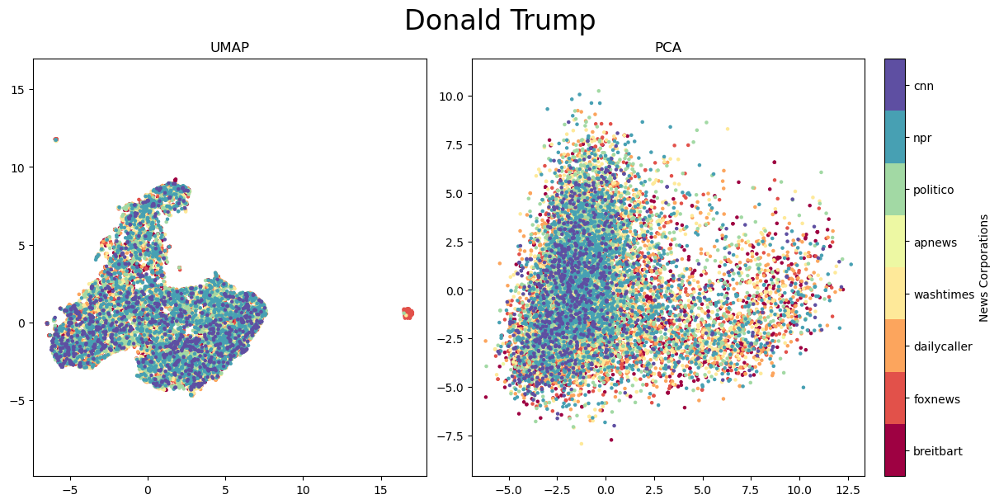

In [34]:
# Q5: For a specific politician, whether the emotion logits can be used to distinguish the media corporations?
name_cor(data2, 'Donald Trump', a=1)

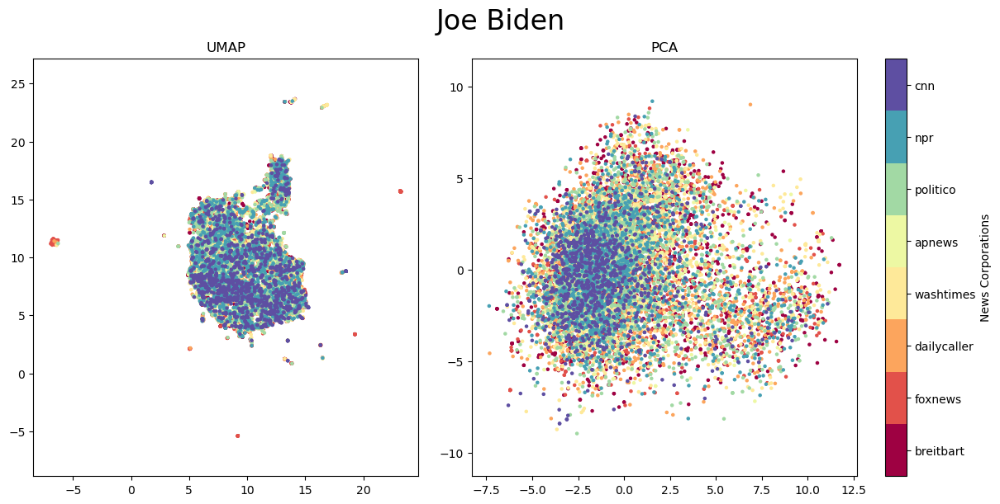

In [35]:
name_cor(data2, 'Joe Biden', a=1)

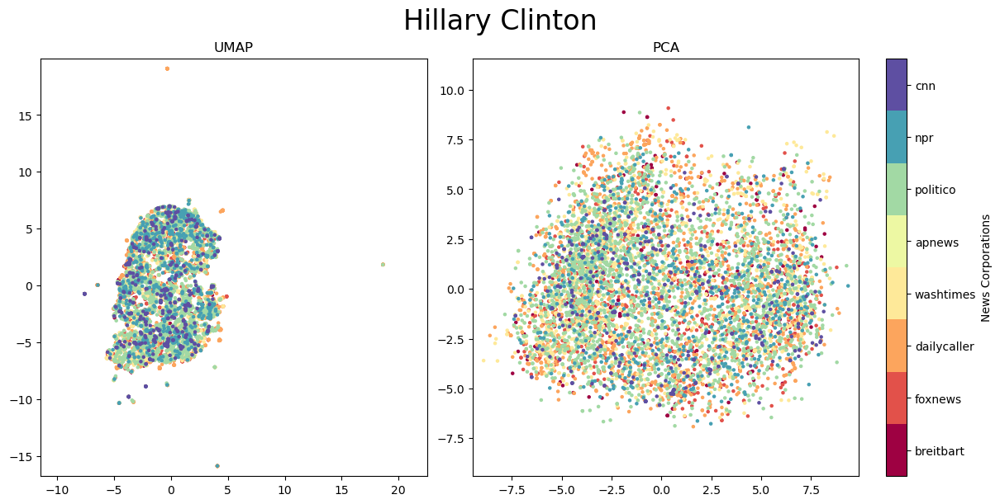

In [36]:
name_cor(data2, 'Hillary Clinton', a=1)

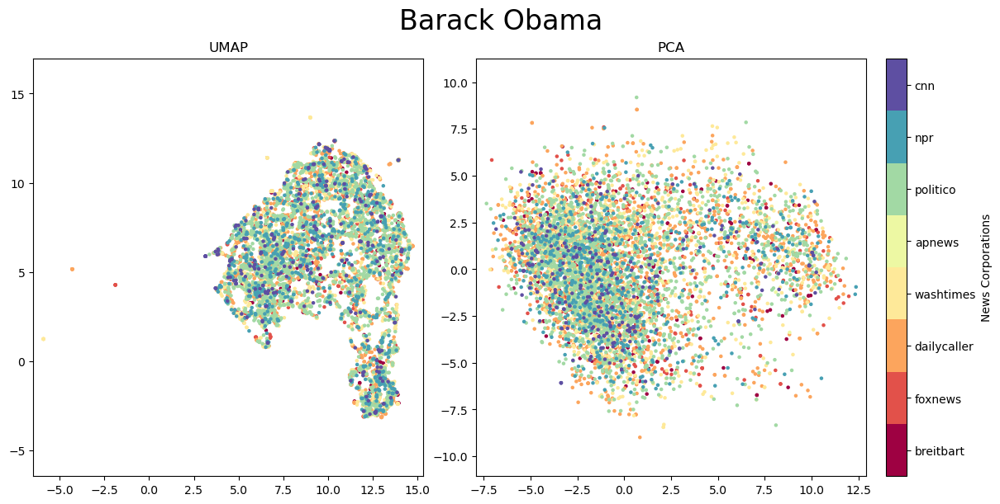

In [37]:
name_cor(data2, 'Barack Obama', a=1)

In [38]:
data3 = {}
# {"names": (embd faces, emo logits, wing labels)}

for name, val in pe.items():
    d = [] #embedding vectors
    e = [] #emotion
    cor_label = []
    count = 0
    for cor in corporation_bias_ordered:

        d.append(val[cor][1])
        e.append(val[cor][0])
        #cor_label += [count]*len(val[cor][2])
        #count += 1
        if cor in ['cnn', 'npr', 'politico', 'apnews']: # left wing
            cor_label += [1]*len(val[cor][2])
        else:                                           # right wing
            cor_label += [0]*len(val[cor][2])
    d = torch.cat(d, dim=0)
    e = torch.cat(e, dim=0)
    
    #Logit
    data3[name] = (d,e,cor_label)
    # Probability
    # data3[name] = (d,softmax(e,dim=1),cor_label)

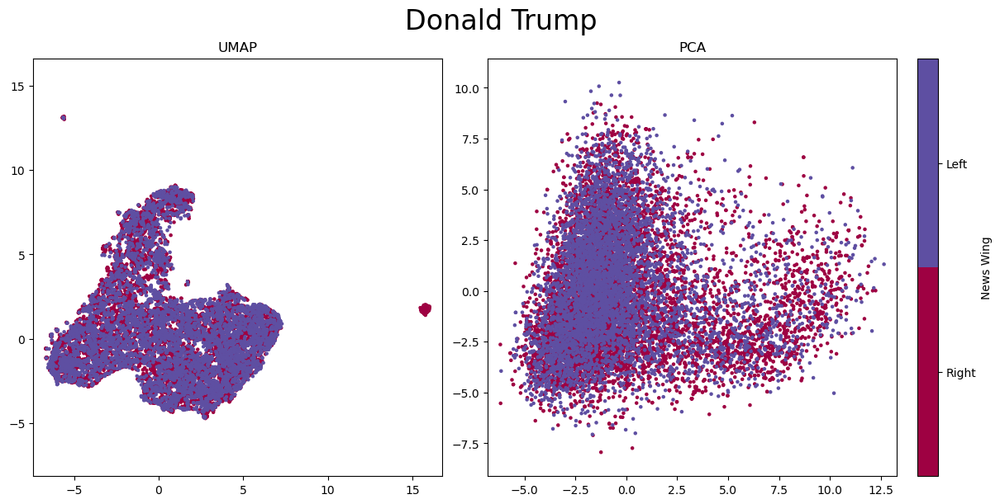

In [39]:
# Q6: For a specific politician, whether the emotion logits can be used to distinguish the political bias?
name_cor(data3, 'Donald Trump', a=1)

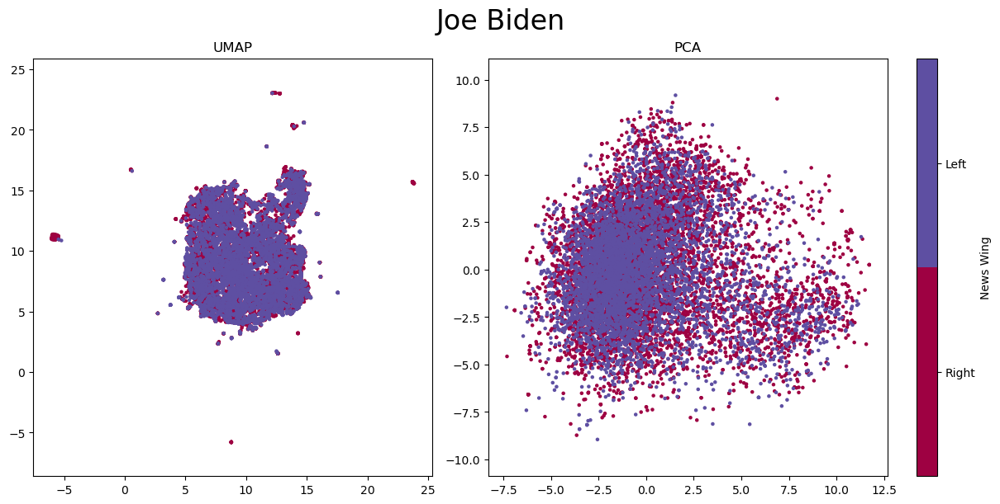

In [40]:
name_cor(data3, 'Joe Biden', a=1)

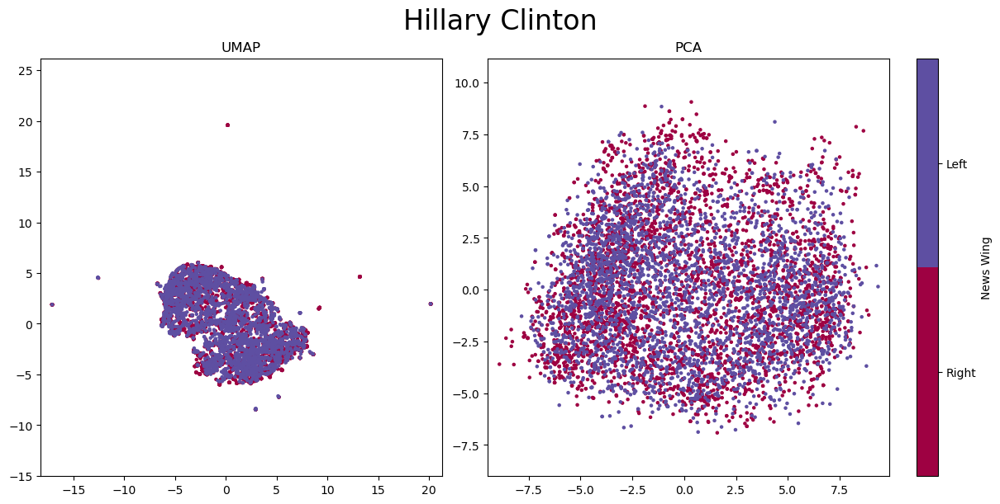

In [41]:
name_cor(data3, 'Hillary Clinton', a=1)

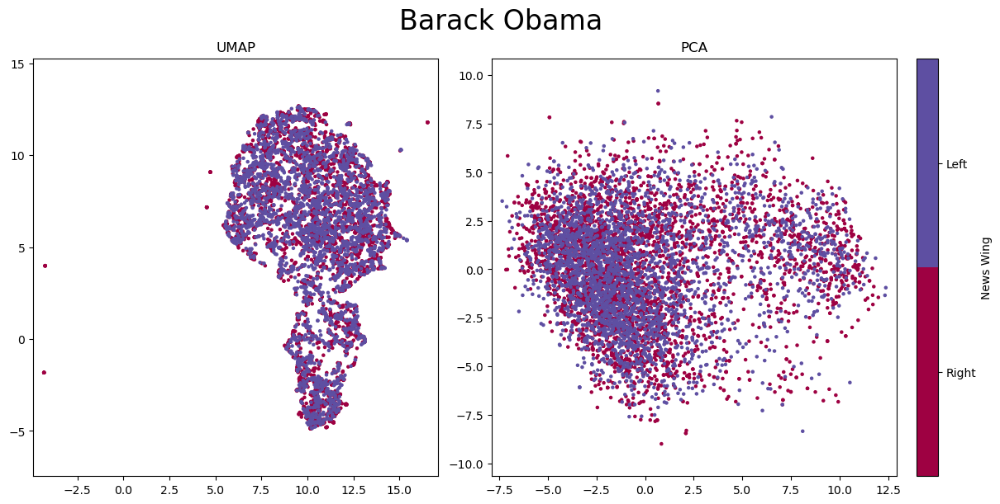

In [42]:
name_cor(data3, 'Barack Obama', a=1)

In [29]:
data4 = {}
# {"names": (embd faces, emo probs, cor labels)}

for name, val in pe.items():
    d = [] #embedding vectors
    e = [] #emotion
    cor_label = []
    count = 0
    for cor in corporation_bias_ordered:

        d.append(val[cor][1])
        e.append(val[cor][0])
        cor_label += [count]*len(val[cor][2])
        count += 1
        #if cor in ['cnn', 'npr', 'politico', 'apnews']: # left wing
        #    cor_label += [1]*len(val[2])
        #else:                                           # right wing
        #    cor_label += [0]*len(val[2])
    d = torch.cat(d, dim=0)
    e = torch.cat(e, dim=0)
    
    #Logit
    #data2[name] = (d,e,cor_label)
    #Probability
    data4[name] = (d,softmax(e,dim=1),cor_label)

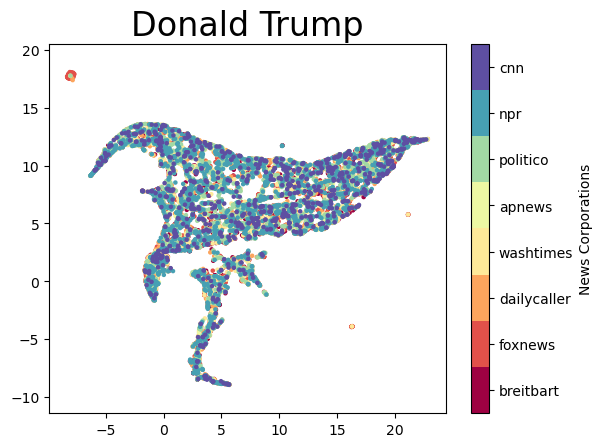

In [30]:
# Q7: For a specific politician, whether the emotion probabilities can be used to distinguish the media corporation?
name_cor(data4, 'Donald Trump', a=1, method='umap')

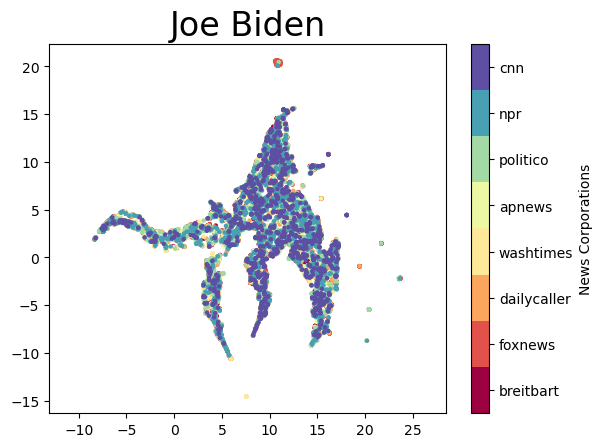

In [31]:
name_cor(data4, 'Joe Biden', a=1, method='umap')

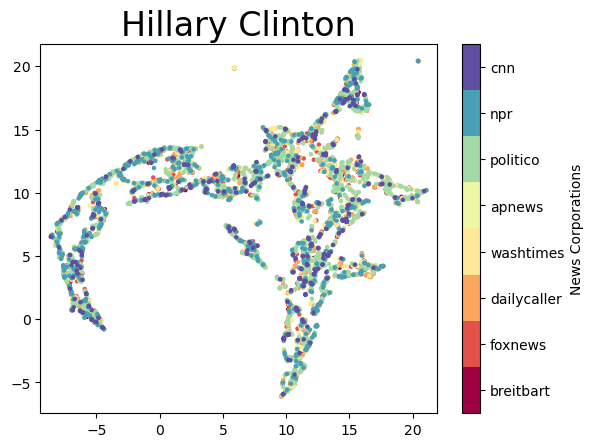

In [32]:
name_cor(data4, 'Hillary Clinton', a=1, method='umap')

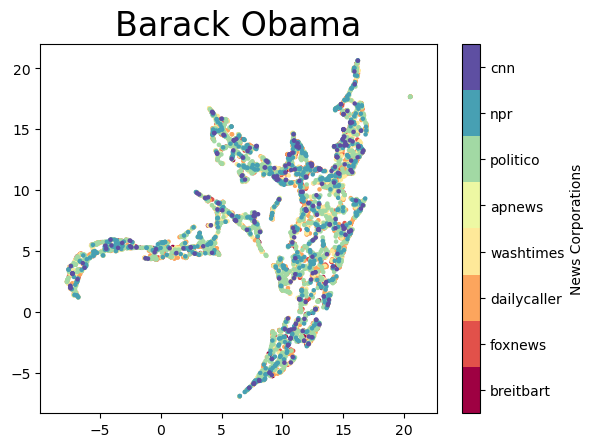

In [33]:
name_cor(data4, 'Barack Obama', a=1, method='umap')

In [9]:
data5 = {}
# {"names": (embd faces, emo probs, wing labels)}

for name, val in pe.items():
    d = [] #embedding vectors
    e = [] #emotion
    cor_label = []
    count = 0
    for cor in corporation_bias_ordered:

        d.append(val[cor][1])
        e.append(val[cor][0])
        #cor_label += [count]*len(val[cor][2])
        #count += 1
        if cor in ['cnn', 'npr', 'politico', 'apnews']: # left wing
            cor_label += [1]*len(val[cor][2])
        else:                                           # right wing
            cor_label += [0]*len(val[cor][2])
    d = torch.cat(d, dim=0)
    e = torch.cat(e, dim=0)
    
    #Logit
    #data2[name] = (d,e,cor_label)
    #Probability
    data5[name] = (d,softmax(e,dim=1),cor_label)

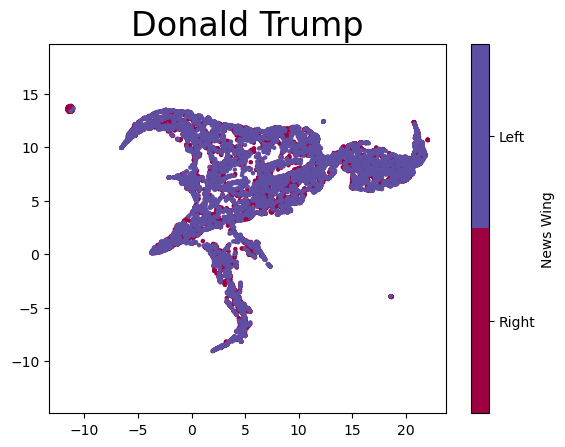

In [35]:
name_cor(data5, 'Donald Trump', a=1, method='umap')

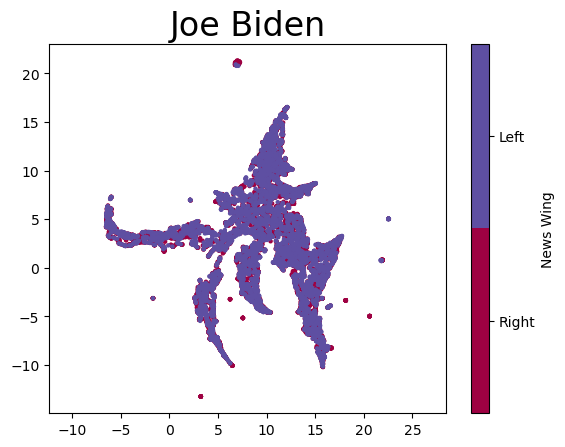

In [36]:
name_cor(data5, 'Joe Biden', a=1, method='umap')

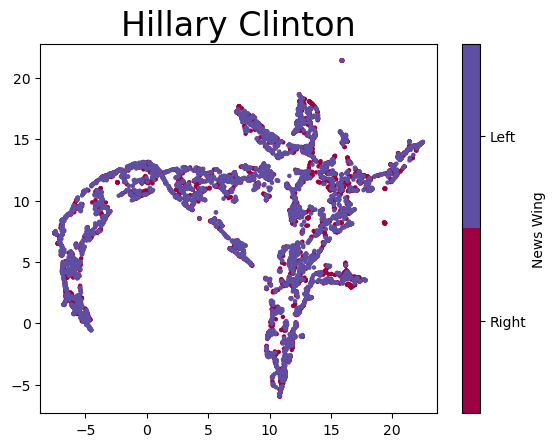

In [37]:
name_cor(data5, 'Hillary Clinton', a=1, method='umap')

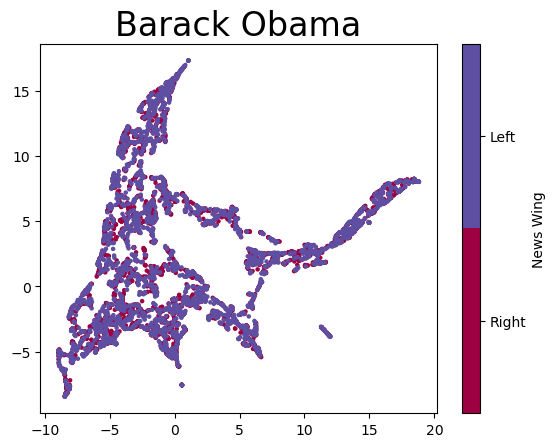

In [41]:
name_cor(data5, 'Barack Obama', a=1, method='umap')

Now analyzing the emotion from Joe Biden
cnn
Number of Samples: 1303
Average emotion: [0.4868, 0.0964, 0.0553, 0.0093, 0.2243, 0.0675, 0.0605]
Dominate Emotion: Angry
npr
Number of Samples: 1467
Average emotion: [0.4454, 0.0614, 0.0525, 0.0257, 0.2236, 0.1120, 0.0794]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.4887, 0.0570, 0.0527, 0.0232, 0.1935, 0.1114, 0.0735]
Dominate Emotion: Angry
apnews
Number of Samples: 546
Average emotion: [0.4822, 0.0561, 0.0502, 0.0437, 0.1817, 0.1297, 0.0564]
Dominate Emotion: Angry
washtimes
Number of Samples: 2000
Average emotion: [0.4091, 0.0488, 0.0647, 0.0275, 0.2084, 0.1667, 0.0747]
Dominate Emotion: Angry
dailycaller
Number of Samples: 2000
Average emotion: [0.4366, 0.0652, 0.0699, 0.0267, 0.2250, 0.1064, 0.0702]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.3913, 0.0637, 0.0469, 0.0208, 0.2731, 0.1057, 0.0985]
Dominate Emotion: Angry
breitbart
Number of Samples: 2000
Average emotion: [

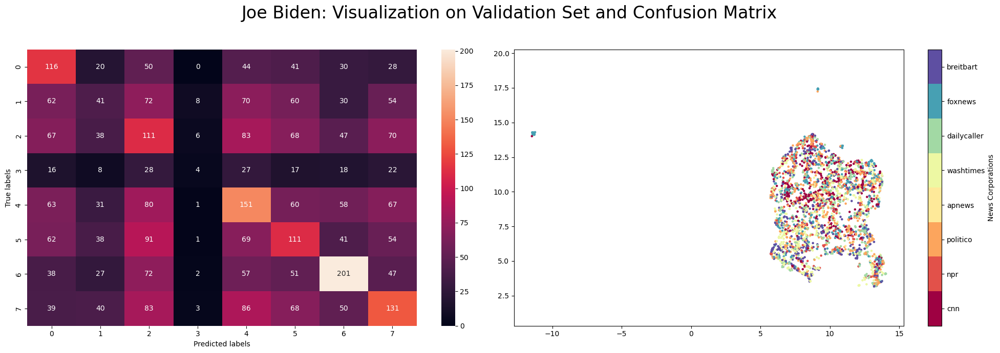

Now analyzing the emotion from Donald Trump
cnn
Number of Samples: 912
Average emotion: [0.8125, 0.0050, 0.0066, 0.0019, 0.0737, 0.0363, 0.0639]
Dominate Emotion: Angry
npr
Number of Samples: 2000
Average emotion: [0.6883, 0.0080, 0.0110, 0.0067, 0.1259, 0.0629, 0.0971]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.7194, 0.0082, 0.0118, 0.0047, 0.0962, 0.0783, 0.0815]
Dominate Emotion: Angry
apnews
Number of Samples: 162
Average emotion: [0.7083, 0.0074, 0.0132, 0.0043, 0.1559, 0.0420, 0.0689]
Dominate Emotion: Angry
washtimes
Number of Samples: 2000
Average emotion: [0.7324, 0.0094, 0.0097, 0.0059, 0.0944, 0.0691, 0.0792]
Dominate Emotion: Angry
dailycaller
Number of Samples: 2000
Average emotion: [0.7239, 0.0120, 0.0111, 0.0085, 0.1143, 0.0533, 0.0769]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.7056, 0.0062, 0.0072, 0.0073, 0.0915, 0.0664, 0.1158]
Dominate Emotion: Angry
breitbart
Number of Samples: 2000
Average emotion:

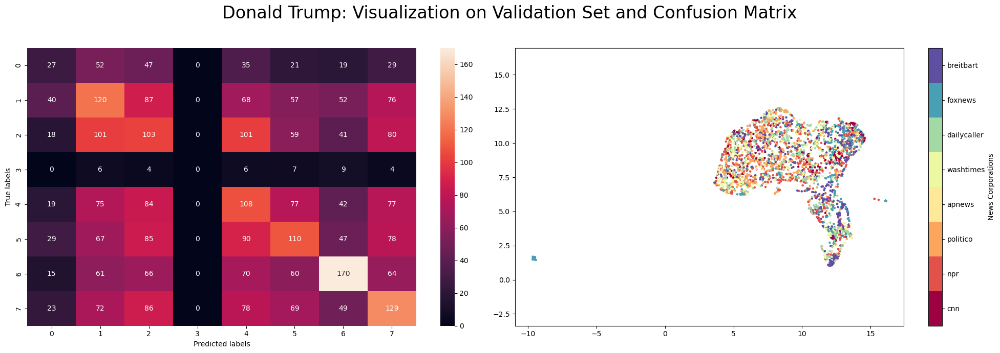

Now analyzing the emotion from Barack Obama
cnn
Number of Samples: 293
Average emotion: [0.3968, 0.0138, 0.0091, 0.0415, 0.2488, 0.0687, 0.2213]
Dominate Emotion: Angry
npr
Number of Samples: 674
Average emotion: [0.4344, 0.0155, 0.0091, 0.0750, 0.2084, 0.0607, 0.1968]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.4685, 0.0195, 0.0105, 0.0572, 0.2022, 0.0639, 0.1783]
Dominate Emotion: Angry
apnews
Number of Samples: 25
Average emotion: [0.1158, 0.0152, 0.0097, 0.7634, 0.0242, 0.0580, 0.0137]
Dominate Emotion: Happy
washtimes
Number of Samples: 1285
Average emotion: [0.4368, 0.0223, 0.0105, 0.0742, 0.2224, 0.0599, 0.1739]
Dominate Emotion: Angry
dailycaller
Number of Samples: 1843
Average emotion: [0.3909, 0.0197, 0.0092, 0.0969, 0.2324, 0.0508, 0.2001]
Dominate Emotion: Angry
foxnews
Number of Samples: 524
Average emotion: [0.4711, 0.0145, 0.0069, 0.0528, 0.2051, 0.0486, 0.2010]
Dominate Emotion: Angry
breitbart
Number of Samples: 315
Average emotion: [0.

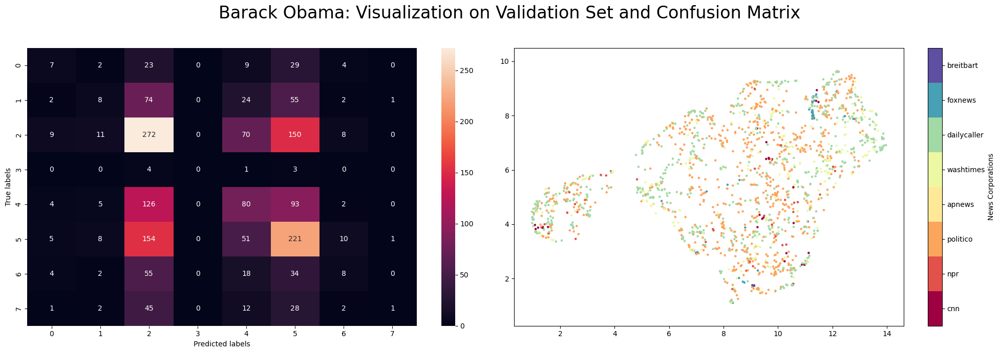

Now analyzing the emotion from Hillary Clinton
cnn
Number of Samples: 444
Average emotion: [0.0884, 0.0046, 0.0259, 0.3023, 0.1549, 0.2580, 0.1659]
Dominate Emotion: Happy
npr
Number of Samples: 661
Average emotion: [0.0551, 0.0038, 0.0268, 0.4754, 0.0974, 0.2636, 0.0779]
Dominate Emotion: Happy
politico
Number of Samples: 2000
Average emotion: [0.1010, 0.0047, 0.0263, 0.2876, 0.1321, 0.3091, 0.1392]
Dominate Emotion: Surprise
apnews
Number of Samples: 1
Average emotion: [0.0001, 0.0000, 0.0000, 0.9966, 0.0001, 0.0031, 0.0000]
Dominate Emotion: Happy
washtimes
Number of Samples: 1321
Average emotion: [0.1120, 0.0047, 0.0260, 0.2991, 0.1093, 0.3364, 0.1125]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 1713
Average emotion: [0.1135, 0.0050, 0.0304, 0.3164, 0.1143, 0.3082, 0.1122]
Dominate Emotion: Happy
foxnews
Number of Samples: 768
Average emotion: [0.1044, 0.0050, 0.0197, 0.3910, 0.1066, 0.2401, 0.1331]
Dominate Emotion: Happy
breitbart
Number of Samples: 263
Average emot

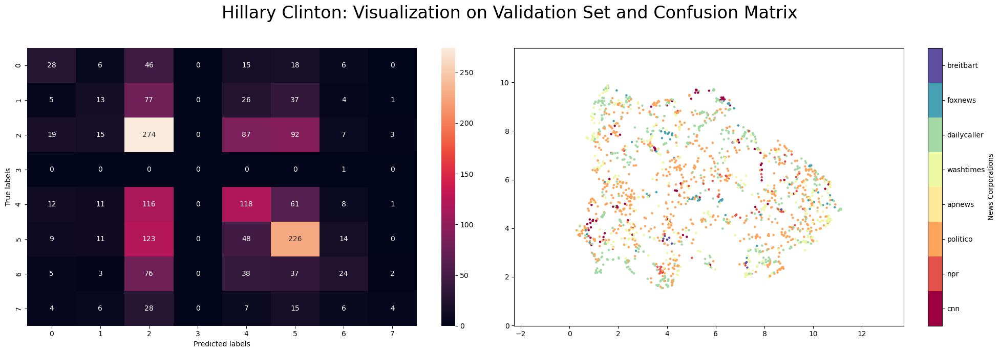

Now analyzing the emotion from Kamala Harris
cnn
Number of Samples: 129
Average emotion: [0.0842, 0.0077, 0.0170, 0.3879, 0.0967, 0.2300, 0.1765]
Dominate Emotion: Happy
npr
Number of Samples: 235
Average emotion: [0.0703, 0.0080, 0.0313, 0.3984, 0.0944, 0.2996, 0.0979]
Dominate Emotion: Happy
politico
Number of Samples: 952
Average emotion: [0.0778, 0.0078, 0.0291, 0.2516, 0.0958, 0.3960, 0.1419]
Dominate Emotion: Surprise
apnews
Number of Samples: 41
Average emotion: [0.1500, 0.0244, 0.0298, 0.2513, 0.1851, 0.1890, 0.1704]
Dominate Emotion: Happy
washtimes
Number of Samples: 394
Average emotion: [0.0593, 0.0061, 0.0389, 0.1943, 0.0783, 0.4839, 0.1392]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 887
Average emotion: [0.0849, 0.0112, 0.0353, 0.2236, 0.1206, 0.3589, 0.1655]
Dominate Emotion: Surprise
foxnews
Number of Samples: 1410
Average emotion: [0.0122, 0.0033, 0.0213, 0.4454, 0.0237, 0.4585, 0.0356]
Dominate Emotion: Surprise
breitbart
Number of Samples: 548
Average e

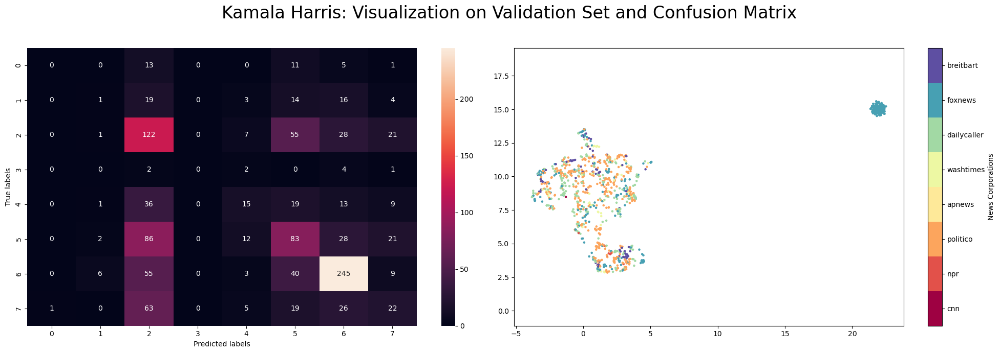

Now analyzing the emotion from Kevin McCarthy
cnn
Number of Samples: 54
Average emotion: [0.3155, 0.0115, 0.0080, 0.0028, 0.3027, 0.0541, 0.3053]
Dominate Emotion: Angry
npr
Number of Samples: 166
Average emotion: [0.4284, 0.0332, 0.0107, 0.0231, 0.1110, 0.0909, 0.3026]
Dominate Emotion: Angry
politico
Number of Samples: 853
Average emotion: [0.4219, 0.0501, 0.0131, 0.0089, 0.1422, 0.0904, 0.2734]
Dominate Emotion: Angry
apnews
Number of Samples: 32
Average emotion: [0.5647, 0.0162, 0.0043, 0.0045, 0.0408, 0.0951, 0.2745]
Dominate Emotion: Angry
washtimes
Number of Samples: 300
Average emotion: [0.3410, 0.0272, 0.0201, 0.0086, 0.1496, 0.1798, 0.2736]
Dominate Emotion: Angry
dailycaller
Number of Samples: 599
Average emotion: [0.4269, 0.0255, 0.0085, 0.0091, 0.1847, 0.0570, 0.2883]
Dominate Emotion: Angry
foxnews
Number of Samples: 1270
Average emotion: [0.2256, 0.0014, 0.0010, 0.0016, 0.0500, 0.3065, 0.4138]
Dominate Emotion: Neutral
breitbart
Number of Samples: 288
Average emotion: [0

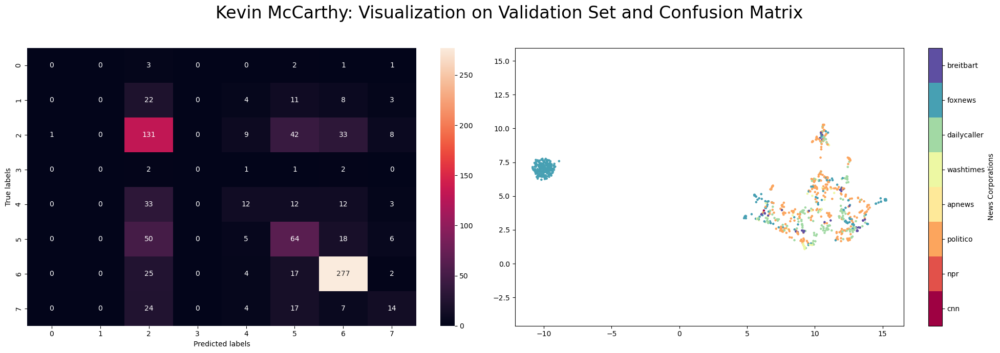

Now analyzing the emotion from Mike Pence
cnn
Number of Samples: 115
Average emotion: [0.7698, 0.0101, 0.0020, 0.0009, 0.1125, 0.0020, 0.1027]
Dominate Emotion: Angry
npr
Number of Samples: 354
Average emotion: [0.7098, 0.0303, 0.0050, 0.0078, 0.1209, 0.0065, 0.1197]
Dominate Emotion: Angry
politico
Number of Samples: 1468
Average emotion: [0.6979, 0.0453, 0.0068, 0.0052, 0.1235, 0.0102, 0.1110]
Dominate Emotion: Angry
apnews
Number of Samples: 54
Average emotion: [0.7168, 0.0246, 0.0076, 0.0093, 0.1096, 0.0146, 0.1174]
Dominate Emotion: Angry
washtimes
Number of Samples: 671
Average emotion: [0.7072, 0.0381, 0.0049, 0.0068, 0.1046, 0.0072, 0.1312]
Dominate Emotion: Angry
dailycaller
Number of Samples: 964
Average emotion: [0.6766, 0.0289, 0.0056, 0.0072, 0.1402, 0.0059, 0.1356]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.9207, 0.0019, 0.0010, 0.0003, 0.0299, 0.0006, 0.0456]
Dominate Emotion: Angry
breitbart
Number of Samples: 227
Average emotion: [0.754

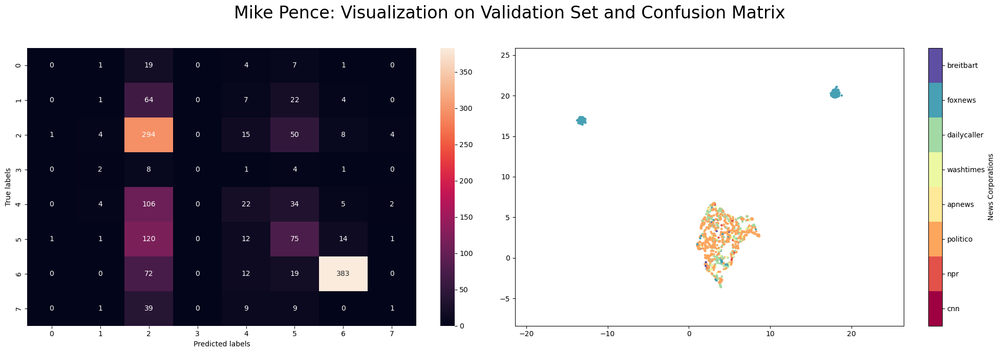

Now analyzing the emotion from Nancy Pelosi
cnn
Number of Samples: 204
Average emotion: [0.0210, 0.0042, 0.0953, 0.0501, 0.0589, 0.7025, 0.0680]
Dominate Emotion: Surprise
npr
Number of Samples: 286
Average emotion: [0.0320, 0.0039, 0.0631, 0.1125, 0.0955, 0.5855, 0.1075]
Dominate Emotion: Surprise
politico
Number of Samples: 1629
Average emotion: [0.0343, 0.0048, 0.0725, 0.0714, 0.1091, 0.6011, 0.1069]
Dominate Emotion: Surprise
apnews
Number of Samples: 81
Average emotion: [0.0602, 0.0072, 0.0393, 0.3118, 0.2316, 0.2688, 0.0812]
Dominate Emotion: Happy
washtimes
Number of Samples: 1606
Average emotion: [0.0175, 0.0028, 0.0687, 0.0597, 0.0490, 0.7409, 0.0615]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 2000
Average emotion: [0.0224, 0.0052, 0.1001, 0.0736, 0.0757, 0.6610, 0.0620]
Dominate Emotion: Surprise
foxnews
Number of Samples: 862
Average emotion: [0.0256, 0.0040, 0.0762, 0.0767, 0.0599, 0.6688, 0.0888]
Dominate Emotion: Surprise
breitbart
Number of Samples: 772
Av

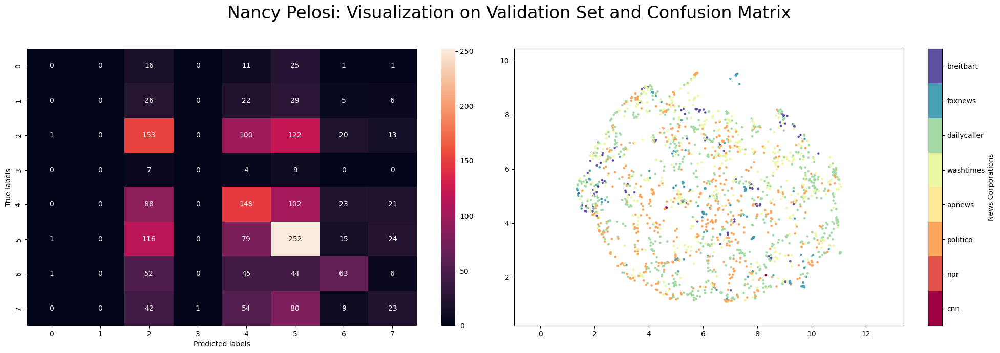

Now analyzing the emotion from Antony Blinken
cnn
Number of Samples: 35
Average emotion: [0.3202, 0.0021, 0.0169, 0.0042, 0.1915, 0.0715, 0.3936]
Dominate Emotion: Neutral
npr
Number of Samples: 36
Average emotion: [0.2960, 0.0021, 0.0280, 0.0078, 0.2817, 0.1175, 0.2669]
Dominate Emotion: Angry
politico
Number of Samples: 199
Average emotion: [0.2704, 0.0019, 0.0179, 0.0035, 0.2869, 0.0911, 0.3282]
Dominate Emotion: Neutral
apnews
Number of Samples: 18
Average emotion: [0.3654, 0.0061, 0.0114, 0.0073, 0.1964, 0.0732, 0.3402]
Dominate Emotion: Angry
washtimes
Number of Samples: 30
Average emotion: [0.2005, 0.0050, 0.0369, 0.0040, 0.2692, 0.1239, 0.3604]
Dominate Emotion: Neutral
dailycaller
Number of Samples: 101
Average emotion: [0.4408, 0.0068, 0.0121, 0.0072, 0.1577, 0.0372, 0.3382]
Dominate Emotion: Angry
foxnews
Number of Samples: 141
Average emotion: [0.1695, 0.0030, 0.0322, 0.0045, 0.2192, 0.1865, 0.3851]
Dominate Emotion: Neutral
breitbart
Number of Samples: 60
Average emotion: 

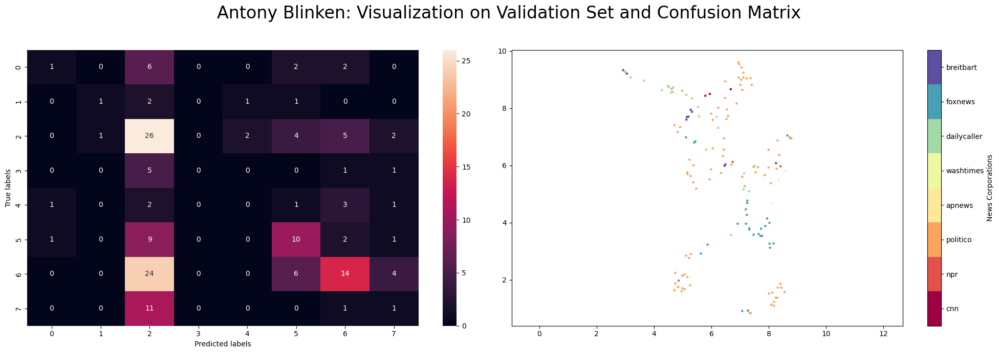

Now analyzing the emotion from Mitch McConnell
cnn
Number of Samples: 145
Average emotion: [0.0696, 0.0030, 0.0904, 0.0052, 0.3261, 0.1778, 0.3279]
Dominate Emotion: Neutral
npr
Number of Samples: 238
Average emotion: [0.1532, 0.0047, 0.0697, 0.0197, 0.2632, 0.1706, 0.3189]
Dominate Emotion: Neutral
politico
Number of Samples: 1439
Average emotion: [0.1342, 0.0046, 0.0941, 0.0107, 0.2739, 0.1837, 0.2988]
Dominate Emotion: Neutral
apnews
Number of Samples: 27
Average emotion: [0.3953, 0.0016, 0.0255, 0.0190, 0.3110, 0.0528, 0.1947]
Dominate Emotion: Angry
washtimes
Number of Samples: 752
Average emotion: [0.0819, 0.0041, 0.1193, 0.0097, 0.3052, 0.2231, 0.2567]
Dominate Emotion: Sad
dailycaller
Number of Samples: 980
Average emotion: [0.0952, 0.0045, 0.0869, 0.0196, 0.2805, 0.2285, 0.2849]
Dominate Emotion: Neutral
foxnews
Number of Samples: 367
Average emotion: [0.1513, 0.0049, 0.0622, 0.0143, 0.3230, 0.1338, 0.3105]
Dominate Emotion: Sad
breitbart
Number of Samples: 223
Average emotion

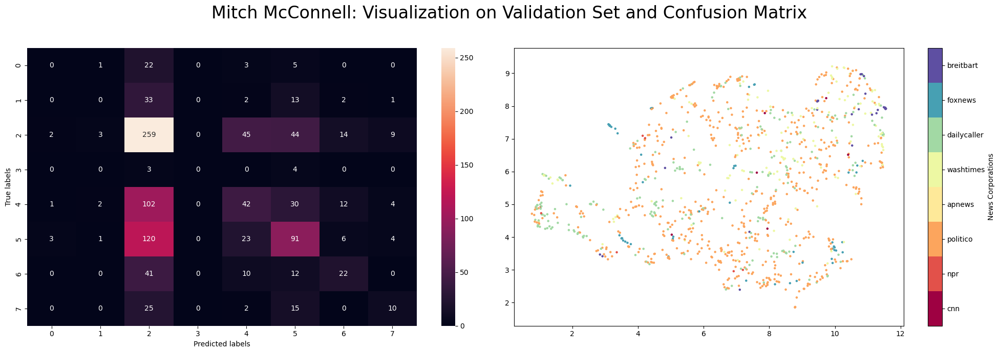

Now analyzing the emotion from Ted Cruz
cnn
Number of Samples: 362
Average emotion: [0.0429, 0.0162, 0.0180, 0.0220, 0.5356, 0.0772, 0.2882]
Dominate Emotion: Sad
npr
Number of Samples: 187
Average emotion: [0.0590, 0.0105, 0.0158, 0.0357, 0.4921, 0.0633, 0.3236]
Dominate Emotion: Sad
politico
Number of Samples: 1575
Average emotion: [0.0529, 0.0123, 0.0173, 0.0137, 0.5389, 0.0956, 0.2692]
Dominate Emotion: Sad
apnews
Number of Samples: 4
Average emotion: [0.0194, 0.0151, 0.0214, 0.0049, 0.6293, 0.1044, 0.2055]
Dominate Emotion: Sad
washtimes
Number of Samples: 454
Average emotion: [0.0386, 0.0088, 0.0151, 0.0100, 0.5158, 0.1489, 0.2628]
Dominate Emotion: Sad
dailycaller
Number of Samples: 763
Average emotion: [0.0472, 0.0128, 0.0131, 0.0106, 0.4879, 0.1017, 0.3267]
Dominate Emotion: Sad
foxnews
Number of Samples: 371
Average emotion: [0.0306, 0.0059, 0.0083, 0.0120, 0.5139, 0.0930, 0.3363]
Dominate Emotion: Sad
breitbart
Number of Samples: 222
Average emotion: [0.0259, 0.0066, 0.0120,

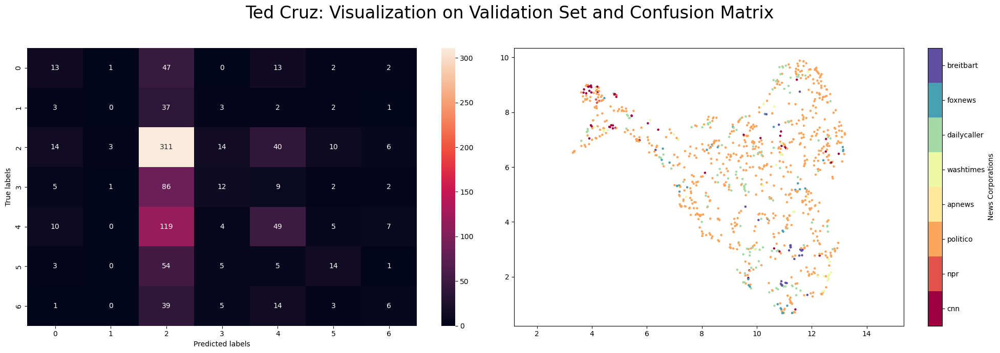

In [17]:
import sys
import seaborn as sns
import torch
import torch.nn.functional as F
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix


try:
    politician_emotions = torch.load("politician_emotions_corporation.pt")
except:
    print("Emotions data politician_emotions_corporation.pt not found.")
    print("Execute name_emotions.py first.")
    sys.exit(1) 

emotions = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
corporation_bias_ordered = ['cnn', 'npr', 'politico', 'apnews', 'washtimes', 'dailycaller', 'foxnews', 'breitbart']
for key, val in politician_emotions.items():
    print(f"Now analyzing the emotion from {key}")
    data = []
    label = []
    num_sample = []
    l = 0
    
    n_left, n_right = 0,0
    
    for cor in corporation_bias_ordered:
        print(cor)
        v = val[cor]
        print(f"Number of Samples: {len(v[2])}")
        num_sample.append(len(v[2]))
        if len(v[2]) == 0:
            continue
        avg_logit = torch.mean(v[0],axis=0)
        avg_prob = F.softmax(avg_logit,dim=0)
        avg_prob_format = '[' + ', '.join(f"{e:.4f}" for e in avg_prob.tolist()) + ']'
        print(f"Average emotion: {avg_prob_format}")
        dominate = emotions[torch.where(avg_logit==max(avg_logit))[0][0]]
        print(f"Dominate Emotion: {dominate}")

        data.append(v[0])
    
        label+= [l]*len(v[2])

        
        l+=1
        
    data = torch.cat(data,dim=0)
    X_train, X_test, y_train, y_test = train_test_split(data, label)
    knn = KNeighborsClassifier(n_neighbors=20)
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_test)

    accuracy = accuracy_score(y_test, predictions)
    print(f"Baseline (naive choice) accuracy is {max(num_sample)/sum(num_sample)}")
    print(f"Prediction Accuracy of KNN classification: {accuracy}")
    print(num_sample)
    print(f"Total Sample Size: {sum(num_sample)}")
    print(f"Standard Deviation of Sample Sizes: {np.std(num_sample)}\n\n")
    
    
    conf_matrix = confusion_matrix(y_test, predictions)


    
    reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')

            # Fit the model to your data and transform it
    embedding = reducer.fit_transform(X_test)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # Plot 1: Heatmap
    sns.heatmap(conf_matrix, annot=True, fmt='g', ax=ax1)
    ax1.set_xlabel('Predicted labels')
    ax1.set_ylabel('True labels')

    # Plot 2: Scatter plot
    scatter = ax2.scatter(embedding[:, 0], embedding[:, 1], c=predictions, cmap='Spectral', s=5)
    ax2.set_aspect('equal', 'datalim')
    colorbar = fig.colorbar(scatter, ax=ax2, boundaries=np.arange(9)-0.5)
    colorbar.set_ticks(np.arange(8))
    colorbar.set_ticklabels(corporation_bias_ordered)
    colorbar.set_label('News Corporations')

    # Set a common title for the whole figure
    fig.suptitle(f'{key}: Visualization on Validation Set and Confusion Matrix', fontsize=24)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust the rectangle [left, bottom, right, top] within which the whole plot will fit

    plt.show()
    
    
    

Now analyzing the emotion from Joe Biden
cnn
Number of Samples: 1303
Average emotion: [0.4868, 0.0964, 0.0553, 0.0093, 0.2243, 0.0675, 0.0605]
Dominate Emotion: Angry
npr
Number of Samples: 1467
Average emotion: [0.4454, 0.0614, 0.0525, 0.0257, 0.2236, 0.1120, 0.0794]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.4887, 0.0570, 0.0527, 0.0232, 0.1935, 0.1114, 0.0735]
Dominate Emotion: Angry
apnews
Number of Samples: 546
Average emotion: [0.4822, 0.0561, 0.0502, 0.0437, 0.1817, 0.1297, 0.0564]
Dominate Emotion: Angry
washtimes
Number of Samples: 2000
Average emotion: [0.4091, 0.0488, 0.0647, 0.0275, 0.2084, 0.1667, 0.0747]
Dominate Emotion: Angry
dailycaller
Number of Samples: 2000
Average emotion: [0.4366, 0.0652, 0.0699, 0.0267, 0.2250, 0.1064, 0.0702]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.3913, 0.0637, 0.0469, 0.0208, 0.2731, 0.1057, 0.0985]
Dominate Emotion: Angry
breitbart
Number of Samples: 2000
Average emotion: [

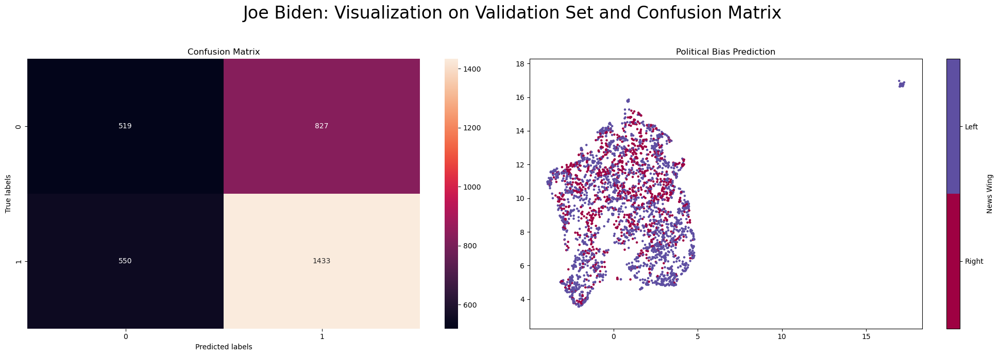

Now analyzing the emotion from Donald Trump
cnn
Number of Samples: 912
Average emotion: [0.8125, 0.0050, 0.0066, 0.0019, 0.0737, 0.0363, 0.0639]
Dominate Emotion: Angry
npr
Number of Samples: 2000
Average emotion: [0.6883, 0.0080, 0.0110, 0.0067, 0.1259, 0.0629, 0.0971]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.7194, 0.0082, 0.0118, 0.0047, 0.0962, 0.0783, 0.0815]
Dominate Emotion: Angry
apnews
Number of Samples: 162
Average emotion: [0.7083, 0.0074, 0.0132, 0.0043, 0.1559, 0.0420, 0.0689]
Dominate Emotion: Angry
washtimes
Number of Samples: 2000
Average emotion: [0.7324, 0.0094, 0.0097, 0.0059, 0.0944, 0.0691, 0.0792]
Dominate Emotion: Angry
dailycaller
Number of Samples: 2000
Average emotion: [0.7239, 0.0120, 0.0111, 0.0085, 0.1143, 0.0533, 0.0769]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.7056, 0.0062, 0.0072, 0.0073, 0.0915, 0.0664, 0.1158]
Dominate Emotion: Angry
breitbart
Number of Samples: 2000
Average emotion:

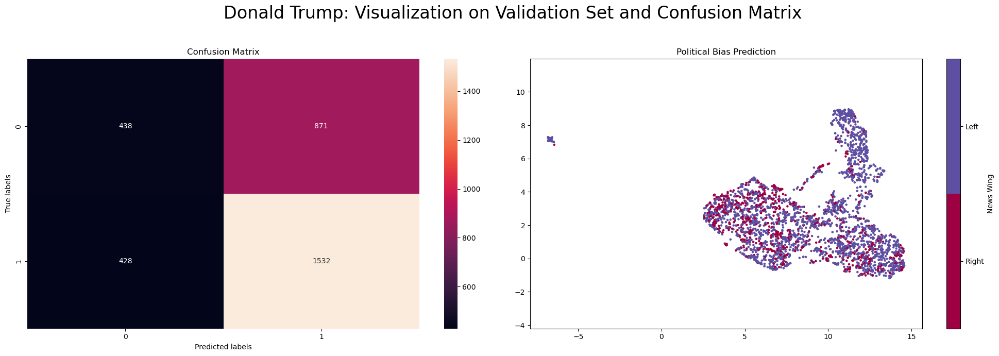

Now analyzing the emotion from Barack Obama
cnn
Number of Samples: 293
Average emotion: [0.3968, 0.0138, 0.0091, 0.0415, 0.2488, 0.0687, 0.2213]
Dominate Emotion: Angry
npr
Number of Samples: 674
Average emotion: [0.4344, 0.0155, 0.0091, 0.0750, 0.2084, 0.0607, 0.1968]
Dominate Emotion: Angry
politico
Number of Samples: 2000
Average emotion: [0.4685, 0.0195, 0.0105, 0.0572, 0.2022, 0.0639, 0.1783]
Dominate Emotion: Angry
apnews
Number of Samples: 25
Average emotion: [0.1158, 0.0152, 0.0097, 0.7634, 0.0242, 0.0580, 0.0137]
Dominate Emotion: Happy
washtimes
Number of Samples: 1285
Average emotion: [0.4368, 0.0223, 0.0105, 0.0742, 0.2224, 0.0599, 0.1739]
Dominate Emotion: Angry
dailycaller
Number of Samples: 1843
Average emotion: [0.3909, 0.0197, 0.0092, 0.0969, 0.2324, 0.0508, 0.2001]
Dominate Emotion: Angry
foxnews
Number of Samples: 524
Average emotion: [0.4711, 0.0145, 0.0069, 0.0528, 0.2051, 0.0486, 0.2010]
Dominate Emotion: Angry
breitbart
Number of Samples: 315
Average emotion: [0.

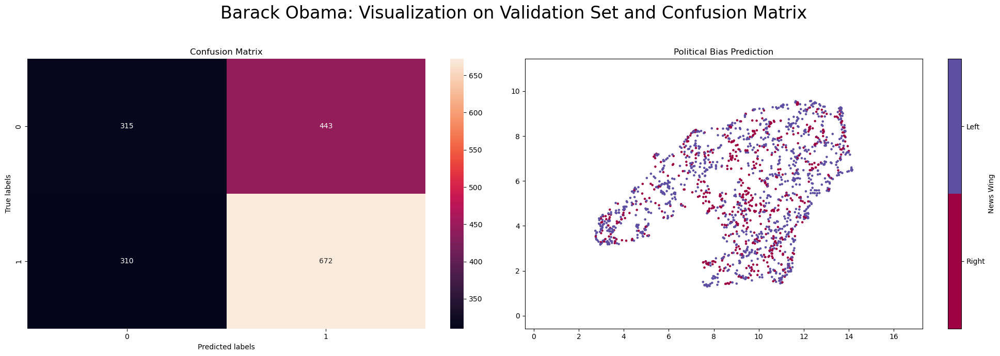

Now analyzing the emotion from Hillary Clinton
cnn
Number of Samples: 444
Average emotion: [0.0884, 0.0046, 0.0259, 0.3023, 0.1549, 0.2580, 0.1659]
Dominate Emotion: Happy
npr
Number of Samples: 661
Average emotion: [0.0551, 0.0038, 0.0268, 0.4754, 0.0974, 0.2636, 0.0779]
Dominate Emotion: Happy
politico
Number of Samples: 2000
Average emotion: [0.1010, 0.0047, 0.0263, 0.2876, 0.1321, 0.3091, 0.1392]
Dominate Emotion: Surprise
apnews
Number of Samples: 1
Average emotion: [0.0001, 0.0000, 0.0000, 0.9966, 0.0001, 0.0031, 0.0000]
Dominate Emotion: Happy
washtimes
Number of Samples: 1321
Average emotion: [0.1120, 0.0047, 0.0260, 0.2991, 0.1093, 0.3364, 0.1125]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 1713
Average emotion: [0.1135, 0.0050, 0.0304, 0.3164, 0.1143, 0.3082, 0.1122]
Dominate Emotion: Happy
foxnews
Number of Samples: 768
Average emotion: [0.1044, 0.0050, 0.0197, 0.3910, 0.1066, 0.2401, 0.1331]
Dominate Emotion: Happy
breitbart
Number of Samples: 263
Average emot

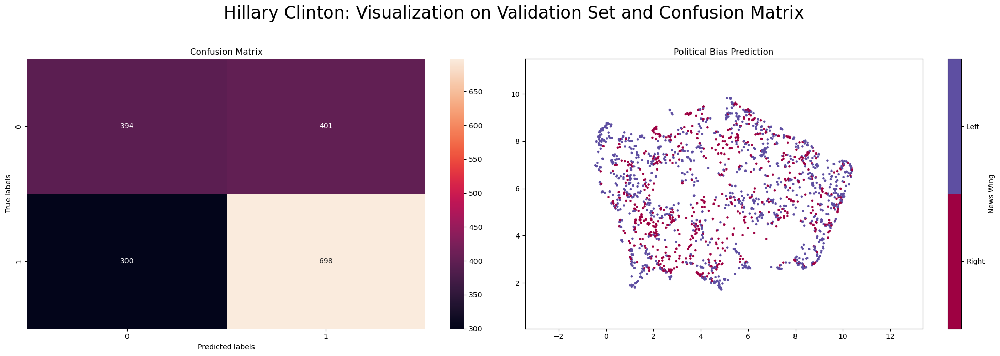

Now analyzing the emotion from Kamala Harris
cnn
Number of Samples: 129
Average emotion: [0.0842, 0.0077, 0.0170, 0.3879, 0.0967, 0.2300, 0.1765]
Dominate Emotion: Happy
npr
Number of Samples: 235
Average emotion: [0.0703, 0.0080, 0.0313, 0.3984, 0.0944, 0.2996, 0.0979]
Dominate Emotion: Happy
politico
Number of Samples: 952
Average emotion: [0.0778, 0.0078, 0.0291, 0.2516, 0.0958, 0.3960, 0.1419]
Dominate Emotion: Surprise
apnews
Number of Samples: 41
Average emotion: [0.1500, 0.0244, 0.0298, 0.2513, 0.1851, 0.1890, 0.1704]
Dominate Emotion: Happy
washtimes
Number of Samples: 394
Average emotion: [0.0593, 0.0061, 0.0389, 0.1943, 0.0783, 0.4839, 0.1392]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 887
Average emotion: [0.0849, 0.0112, 0.0353, 0.2236, 0.1206, 0.3589, 0.1655]
Dominate Emotion: Surprise
foxnews
Number of Samples: 1410
Average emotion: [0.0122, 0.0033, 0.0213, 0.4454, 0.0237, 0.4585, 0.0356]
Dominate Emotion: Surprise
breitbart
Number of Samples: 548
Average e

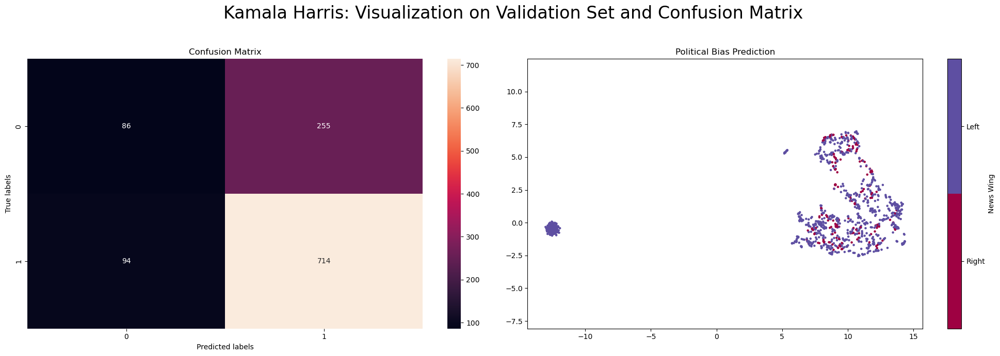

Now analyzing the emotion from Kevin McCarthy
cnn
Number of Samples: 54
Average emotion: [0.3155, 0.0115, 0.0080, 0.0028, 0.3027, 0.0541, 0.3053]
Dominate Emotion: Angry
npr
Number of Samples: 166
Average emotion: [0.4284, 0.0332, 0.0107, 0.0231, 0.1110, 0.0909, 0.3026]
Dominate Emotion: Angry
politico
Number of Samples: 853
Average emotion: [0.4219, 0.0501, 0.0131, 0.0089, 0.1422, 0.0904, 0.2734]
Dominate Emotion: Angry
apnews
Number of Samples: 32
Average emotion: [0.5647, 0.0162, 0.0043, 0.0045, 0.0408, 0.0951, 0.2745]
Dominate Emotion: Angry
washtimes
Number of Samples: 300
Average emotion: [0.3410, 0.0272, 0.0201, 0.0086, 0.1496, 0.1798, 0.2736]
Dominate Emotion: Angry
dailycaller
Number of Samples: 599
Average emotion: [0.4269, 0.0255, 0.0085, 0.0091, 0.1847, 0.0570, 0.2883]
Dominate Emotion: Angry
foxnews
Number of Samples: 1270
Average emotion: [0.2256, 0.0014, 0.0010, 0.0016, 0.0500, 0.3065, 0.4138]
Dominate Emotion: Neutral
breitbart
Number of Samples: 288
Average emotion: [0

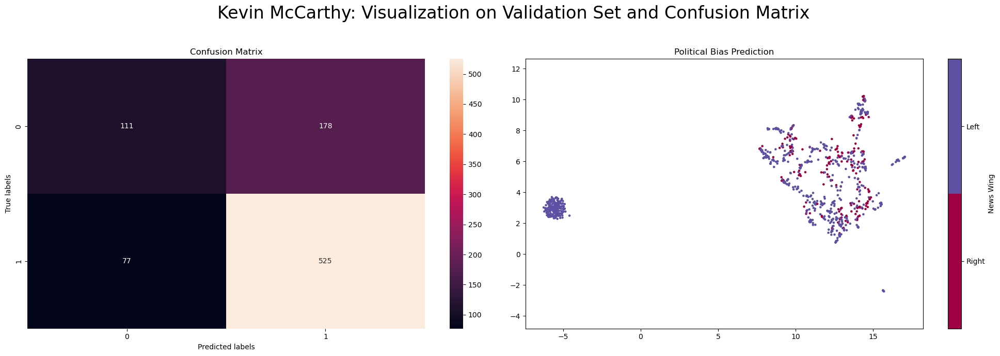

Now analyzing the emotion from Mike Pence
cnn
Number of Samples: 115
Average emotion: [0.7698, 0.0101, 0.0020, 0.0009, 0.1125, 0.0020, 0.1027]
Dominate Emotion: Angry
npr
Number of Samples: 354
Average emotion: [0.7098, 0.0303, 0.0050, 0.0078, 0.1209, 0.0065, 0.1197]
Dominate Emotion: Angry
politico
Number of Samples: 1468
Average emotion: [0.6979, 0.0453, 0.0068, 0.0052, 0.1235, 0.0102, 0.1110]
Dominate Emotion: Angry
apnews
Number of Samples: 54
Average emotion: [0.7168, 0.0246, 0.0076, 0.0093, 0.1096, 0.0146, 0.1174]
Dominate Emotion: Angry
washtimes
Number of Samples: 671
Average emotion: [0.7072, 0.0381, 0.0049, 0.0068, 0.1046, 0.0072, 0.1312]
Dominate Emotion: Angry
dailycaller
Number of Samples: 964
Average emotion: [0.6766, 0.0289, 0.0056, 0.0072, 0.1402, 0.0059, 0.1356]
Dominate Emotion: Angry
foxnews
Number of Samples: 2000
Average emotion: [0.9207, 0.0019, 0.0010, 0.0003, 0.0299, 0.0006, 0.0456]
Dominate Emotion: Angry
breitbart
Number of Samples: 227
Average emotion: [0.754

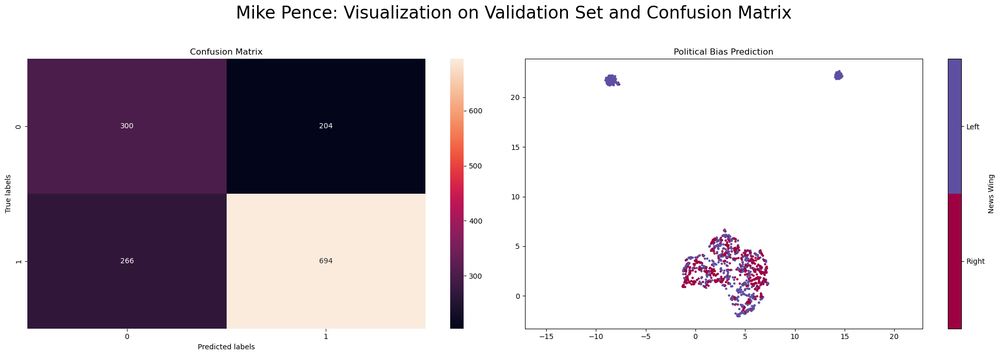

Now analyzing the emotion from Nancy Pelosi
cnn
Number of Samples: 204
Average emotion: [0.0210, 0.0042, 0.0953, 0.0501, 0.0589, 0.7025, 0.0680]
Dominate Emotion: Surprise
npr
Number of Samples: 286
Average emotion: [0.0320, 0.0039, 0.0631, 0.1125, 0.0955, 0.5855, 0.1075]
Dominate Emotion: Surprise
politico
Number of Samples: 1629
Average emotion: [0.0343, 0.0048, 0.0725, 0.0714, 0.1091, 0.6011, 0.1069]
Dominate Emotion: Surprise
apnews
Number of Samples: 81
Average emotion: [0.0602, 0.0072, 0.0393, 0.3118, 0.2316, 0.2688, 0.0812]
Dominate Emotion: Happy
washtimes
Number of Samples: 1606
Average emotion: [0.0175, 0.0028, 0.0687, 0.0597, 0.0490, 0.7409, 0.0615]
Dominate Emotion: Surprise
dailycaller
Number of Samples: 2000
Average emotion: [0.0224, 0.0052, 0.1001, 0.0736, 0.0757, 0.6610, 0.0620]
Dominate Emotion: Surprise
foxnews
Number of Samples: 862
Average emotion: [0.0256, 0.0040, 0.0762, 0.0767, 0.0599, 0.6688, 0.0888]
Dominate Emotion: Surprise
breitbart
Number of Samples: 772
Av

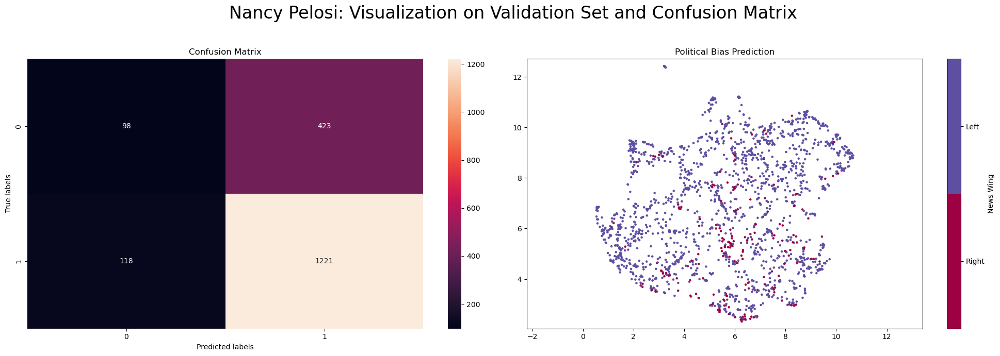

Now analyzing the emotion from Antony Blinken
cnn
Number of Samples: 35
Average emotion: [0.3202, 0.0021, 0.0169, 0.0042, 0.1915, 0.0715, 0.3936]
Dominate Emotion: Neutral
npr
Number of Samples: 36
Average emotion: [0.2960, 0.0021, 0.0280, 0.0078, 0.2817, 0.1175, 0.2669]
Dominate Emotion: Angry
politico
Number of Samples: 199
Average emotion: [0.2704, 0.0019, 0.0179, 0.0035, 0.2869, 0.0911, 0.3282]
Dominate Emotion: Neutral
apnews
Number of Samples: 18
Average emotion: [0.3654, 0.0061, 0.0114, 0.0073, 0.1964, 0.0732, 0.3402]
Dominate Emotion: Angry
washtimes
Number of Samples: 30
Average emotion: [0.2005, 0.0050, 0.0369, 0.0040, 0.2692, 0.1239, 0.3604]
Dominate Emotion: Neutral
dailycaller
Number of Samples: 101
Average emotion: [0.4408, 0.0068, 0.0121, 0.0072, 0.1577, 0.0372, 0.3382]
Dominate Emotion: Angry
foxnews
Number of Samples: 141
Average emotion: [0.1695, 0.0030, 0.0322, 0.0045, 0.2192, 0.1865, 0.3851]
Dominate Emotion: Neutral
breitbart
Number of Samples: 60
Average emotion: 

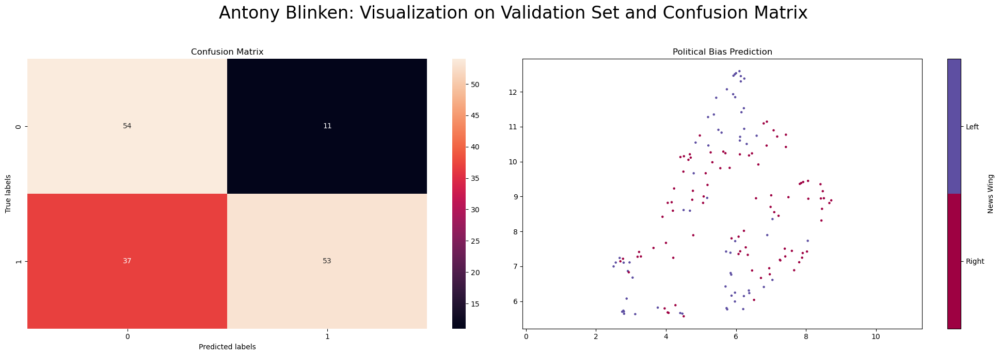

Now analyzing the emotion from Mitch McConnell
cnn
Number of Samples: 145
Average emotion: [0.0696, 0.0030, 0.0904, 0.0052, 0.3261, 0.1778, 0.3279]
Dominate Emotion: Neutral
npr
Number of Samples: 238
Average emotion: [0.1532, 0.0047, 0.0697, 0.0197, 0.2632, 0.1706, 0.3189]
Dominate Emotion: Neutral
politico
Number of Samples: 1439
Average emotion: [0.1342, 0.0046, 0.0941, 0.0107, 0.2739, 0.1837, 0.2988]
Dominate Emotion: Neutral
apnews
Number of Samples: 27
Average emotion: [0.3953, 0.0016, 0.0255, 0.0190, 0.3110, 0.0528, 0.1947]
Dominate Emotion: Angry
washtimes
Number of Samples: 752
Average emotion: [0.0819, 0.0041, 0.1193, 0.0097, 0.3052, 0.2231, 0.2567]
Dominate Emotion: Sad
dailycaller
Number of Samples: 980
Average emotion: [0.0952, 0.0045, 0.0869, 0.0196, 0.2805, 0.2285, 0.2849]
Dominate Emotion: Neutral
foxnews
Number of Samples: 367
Average emotion: [0.1513, 0.0049, 0.0622, 0.0143, 0.3230, 0.1338, 0.3105]
Dominate Emotion: Sad
breitbart
Number of Samples: 223
Average emotion

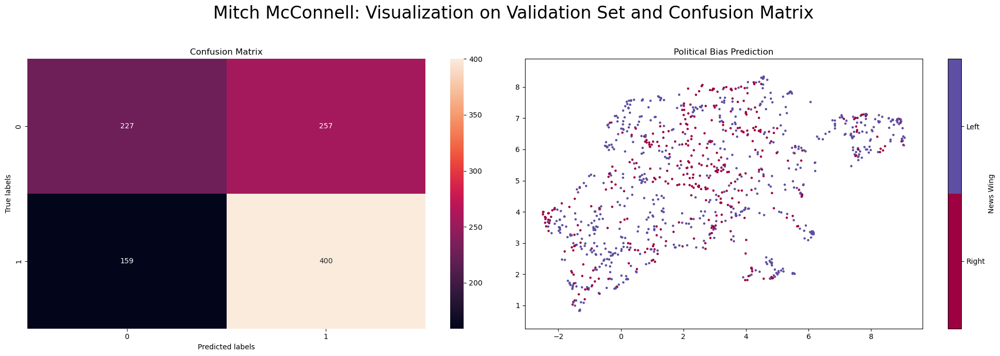

Now analyzing the emotion from Ted Cruz
cnn
Number of Samples: 362
Average emotion: [0.0429, 0.0162, 0.0180, 0.0220, 0.5356, 0.0772, 0.2882]
Dominate Emotion: Sad
npr
Number of Samples: 187
Average emotion: [0.0590, 0.0105, 0.0158, 0.0357, 0.4921, 0.0633, 0.3236]
Dominate Emotion: Sad
politico
Number of Samples: 1575
Average emotion: [0.0529, 0.0123, 0.0173, 0.0137, 0.5389, 0.0956, 0.2692]
Dominate Emotion: Sad
apnews
Number of Samples: 4
Average emotion: [0.0194, 0.0151, 0.0214, 0.0049, 0.6293, 0.1044, 0.2055]
Dominate Emotion: Sad
washtimes
Number of Samples: 454
Average emotion: [0.0386, 0.0088, 0.0151, 0.0100, 0.5158, 0.1489, 0.2628]
Dominate Emotion: Sad
dailycaller
Number of Samples: 763
Average emotion: [0.0472, 0.0128, 0.0131, 0.0106, 0.4879, 0.1017, 0.3267]
Dominate Emotion: Sad
foxnews
Number of Samples: 371
Average emotion: [0.0306, 0.0059, 0.0083, 0.0120, 0.5139, 0.0930, 0.3363]
Dominate Emotion: Sad
breitbart
Number of Samples: 222
Average emotion: [0.0259, 0.0066, 0.0120,

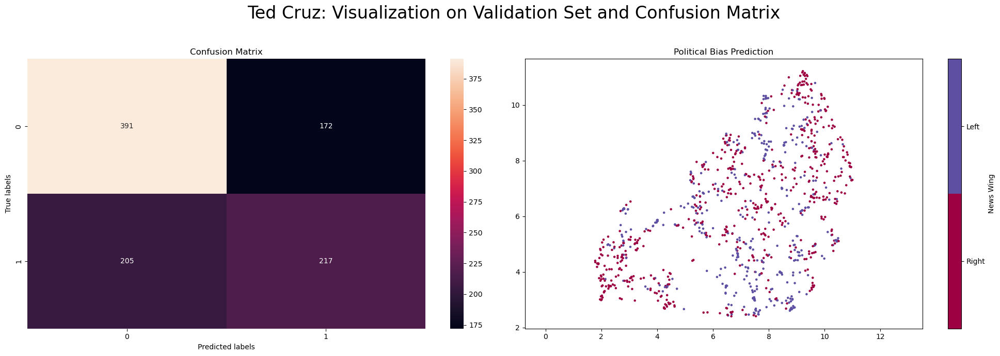

In [22]:
import sys
import torch
import torch.nn.functional as F
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


try:
    politician_emotions = torch.load("politician_emotions_corporation.pt")
except:
    print("Emotions data politician_emotions_corporation.pt not found.")
    print("Execute name_emotions.py first.")
    sys.exit(1) 

emotions = ['Angry', 'Disgust', 'Fear', 'Happy', 'Sad', 'Surprise', 'Neutral']
corporation_bias_ordered = ['cnn', 'npr', 'politico', 'apnews', 'washtimes', 'dailycaller', 'foxnews', 'breitbart']
for key, val in politician_emotions.items():
    print(f"Now analyzing the emotion from {key}")
    data = []
    label = []
    num_sample = []
    l = 0
    
    n_left, n_right = 0,0
    
    for cor in corporation_bias_ordered:
        print(cor)
        v = val[cor]
        print(f"Number of Samples: {len(v[2])}")
        num_sample.append(len(v[2]))
        if len(v[2]) == 0:
            continue
        avg_logit = torch.mean(v[0],axis=0)
        avg_prob = F.softmax(avg_logit,dim=0)
        avg_prob_format = '[' + ', '.join(f"{e:.4f}" for e in avg_prob.tolist()) + ']'
        print(f"Average emotion: {avg_prob_format}")
        dominate = emotions[torch.where(avg_logit==max(avg_logit))[0][0]]
        print(f"Dominate Emotion: {dominate}")

        data.append(v[0])
    
        #label+= [l]*len(v[2])
        if cor in ['cnn', 'npr', 'politico', 'apnews']:
            label += [0]*len(v[2])
            n_left+=len(v[2])
            
        else:
            label += [1]*len(v[2])
            n_right += len(v[2])
        
        l+=1
        
    data = torch.cat(data,dim=0)
    X_train, X_test, y_train, y_test = train_test_split(data, label)
    knn = KNeighborsClassifier(n_neighbors=20)
    knn.fit(X_train, y_train)
    predictions = knn.predict(X_test)

    accuracy = accuracy_score(y_test, predictions)
    print(f"Baseline (naive choice) accuracy is {max(sum(num_sample[:4]),sum(num_sample[4:]))/sum(num_sample)}")
    print(f"Prediction Accuracy of KNN classification: {accuracy}\n\n")
    print(f"Left Sample Size: {sum(num_sample[:4])}")
    print(f"Right Sample Size: {sum(num_sample[4:])}")

    
    conf_matrix = confusion_matrix(y_test, predictions)


    
    reducer = umap.UMAP(n_neighbors=15, n_components=2, metric='euclidean')

            # Fit the model to your data and transform it
    embedding = reducer.fit_transform(X_test)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 7))

    # Plot 1: Heatmap
    sns.heatmap(conf_matrix, annot=True, fmt='g', ax=ax1)
    ax1.set_xlabel('Predicted labels')
    ax1.set_ylabel('True labels')
    ax1.set_title('Confusion Matrix')

    # Plot 2: Scatter plot
    scatter = ax2.scatter(embedding[:, 0], embedding[:, 1], c=predictions, cmap='Spectral', s=5)
    ax2.set_aspect('equal', 'datalim')
    colorbar = fig.colorbar(scatter, ax=ax2, boundaries=np.arange(3)-0.5)
    colorbar.set_ticks(np.arange(2))
    colorbar.set_ticklabels(['Right', 'Left'])
    colorbar.set_label('News Wing')
    ax2.set_title('Political Bias Prediction')

    # Set a common title for the whole figure
    fig.suptitle(f'{key}: Visualization on Validation Set and Confusion Matrix', fontsize=24)

    # Adjust layout
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust the rectangle [left, bottom, right, top] within which the whole plot will fit

    plt.show()